# TASK #1: UNDERSTAND THE PROBLEM STATMENT AND BUSINESS CASE

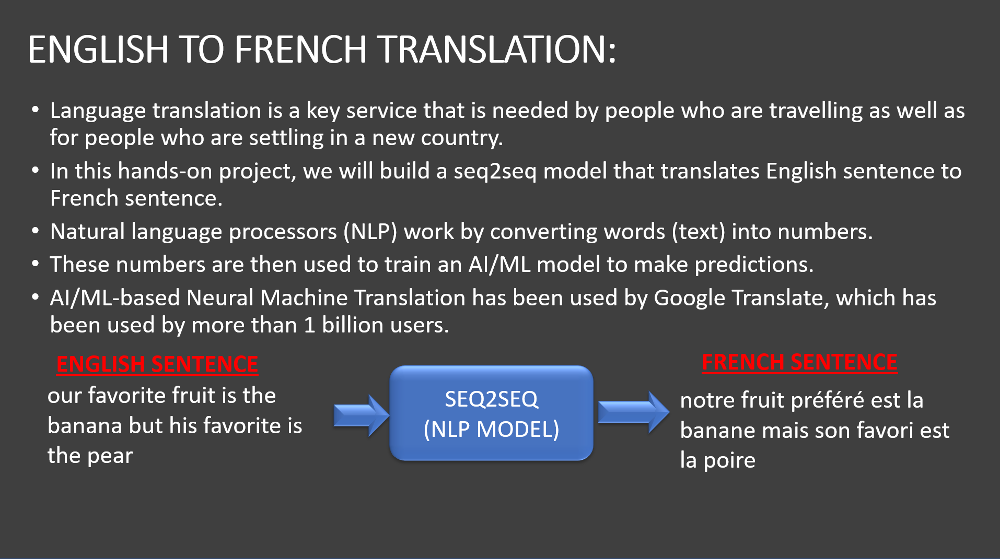

# TASK #2: IMPORT LIBRARIES AND DATASETS

In [2]:
!pip install --upgrade tensorflow-gpu==2.9.1

  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4847 sha256=7f0c82e8a38af03d24f9888f4932798178d61fb8a4cd02c8843bb77c79dafa82
  Stored in directory: c:\users\suman\appdata\local\pip\cache\wheels\b6\0d\90\0d1bbd99855f99cb2f6c2e5ff96f8023fad8ec367695f7d72d
Successfully built termcolor


In [6]:
# install nltk
!pip install nltk
# install gensim
!pip install gensim
# install spacy
!pip install spacy
!pip install plotly
!pip install wordcloud

In [4]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [7]:
from collections import Counter
import operator
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, TimeDistributed, RepeatVector, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model

In [9]:
# load the data
df_english = pd.read_csv('small_vocab_en.csv', sep = '/t', names = ['english'],engine='python')
df_french = pd.read_csv('small_vocab_fr.csv', sep = '/t', names = ['french'],engine='python')

MINI CHALLENGE #1: 
- Explore the 'english' and 'french' data and indicate how many samples are included.
- Do we have Null elements? What are the memory usage for both dataframes?

In [11]:
df_english.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137860 entries, 0 to 137859
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   english  137860 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


In [12]:
df_english.sample(frac=0.05)

,english
36993,"france is never rainy during winter , but it i..."
6977,"his favorite fruit is the mango , but your fav..."
72901,"california is usually chilly during fall , and..."
91004,"california is sometimes rainy during march , a..."
59930,"china is sometimes busy during fall , but it i..."
...,...
118467,"you dislike bananas , apples , and peaches ."
21476,"france is never snowy during june , but it is ..."
60799,"they dislike bananas , strawberries , and limes ."
132892,"they dislike strawberries , peaches , and grap..."


In [13]:
df_french.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137860 entries, 0 to 137859
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   french  137860 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


In [14]:
df_french.sample(frac=0.05)

,french
137009,il conduit cette vieille voiture noire .
100213,"elle déteste les bananes , les oranges et les ..."
115659,elle n'aime un camion vert brillant .
53294,les états-unis est parfois occupé au mois d' a...
429,"vous n'aimez pas les mangues , les citrons et ..."
...,...
125350,"les états-unis est jamais froid en juillet , e..."
58715,"l' inde est généralement calme en décembre , e..."
131666,"la pêche est son fruit préféré , mais la chaux..."
8563,"nous aimons les mangues , les bananes et les c..."


In [20]:
df_english.isnull().any()

english    False
dtype: bool

In [21]:
df_french.isnull().any()

french    False
dtype: bool

MINI CHALLENGE #2:
- Concatenate both dataframes and indicate how many records are present
- Print out the following: "Total English Records = xx, Total French Records = xx"

In [23]:
df = pd.concat([df_english,df_french],axis=1)
df.sample(frac=0.05)

,english,french
76944,"she dislikes mangoes , bananas , and apples .","elle déteste les bananes , les mangues et les ..."
42264,"china is sometimes wet during winter , but it ...","la chine est parfois humide pendant l' hiver ,..."
34982,"california is mild during june , but it is nev...","californie est doux au mois de juin , mais il ..."
7289,"new jersey is usually warm during fall , and i...",new jersey est généralement chaud pendant l' a...
26751,"new jersey is relaxing during february , but i...","new jersey est relaxant en février , mais il e..."
...,...,...
74274,"india is sometimes nice during september , and...","l' inde est parfois agréable en septembre , et..."
69113,"california is usually busy during summer , and...",californie est généralement occupé pendant l' ...
4291,"his favorite fruit is the strawberry , but our...","son fruit préféré est la fraise , mais notre p..."
105924,she dislikes lemons and bananas .,elle déteste les citrons et les bananes .


In [24]:
print(f'Total English Records = {len(df)}')
print(f'Total French Records = {len(df)}')

Total English Records = 137860
Total French Records = 137860


# TASK #3: PERFORM DATA CLEANING

In [25]:
# download nltk packages
nltk.download('punkt')

# download stopwords
nltk.download("stopwords")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [27]:
# function to remove punctuations
def remove_punc(x):
  return re.sub('[!#?,.:";]', '', x)

In [28]:
df['french'] = df['french'].apply(remove_punc)
df['english'] = df['english'].apply(remove_punc)

In [45]:
english_words = []
french_words  = []

MINI CHALLENGE #3:
- How many unique words are available in the english and french dictionairies?





In [50]:
def add_words(text,word_list):
    for word in text.split():
        if word not in word_list:
            word_list.append(word)

df['english'].apply(lambda x: add_words(x, english_words))
df['french'].apply(lambda x: add_words(x, french_words))

0         None
1         None
2         None
3         None
4         None
          ... 
137855    None
137856    None
137857    None
137858    None
137859    None
Name: french, Length: 137860, dtype: object

In [51]:
len(english_words)

199

In [52]:
# number of unique words in french
len(french_words)

350

In [53]:
print(english_words)

['new', 'jersey', 'is', 'sometimes', 'quiet', 'during', 'autumn', 'and', 'it', 'snowy', 'in', 'april', 'the', 'united', 'states', 'usually', 'chilly', 'july', 'freezing', 'november', 'california', 'march', 'hot', 'june', 'mild', 'cold', 'september', 'your', 'least', 'liked', 'fruit', 'grape', 'but', 'my', 'apple', 'his', 'favorite', 'orange', 'paris', 'relaxing', 'december', 'busy', 'spring', 'never', 'our', 'lemon', 'january', 'warm', 'lime', 'her', 'banana', 'he', 'saw', 'a', 'old', 'yellow', 'truck', 'india', 'rainy', 'that', 'cat', 'was', 'most', 'loved', 'animal', 'dislikes', 'grapefruit', 'limes', 'lemons', 'february', 'china', 'pleasant', 'october', 'wonderful', 'nice', 'summer', 'france', 'may', 'grapes', 'mangoes', 'their', 'mango', 'pear', 'august', 'beautiful', 'apples', 'peaches', 'feared', 'shark', 'wet', 'dry', 'we', 'like', 'oranges', 'they', 'pears', 'she', 'little', 'red', 'winter', 'disliked', 'rusty', 'car', 'strawberries', 'i', 'strawberry', 'bananas', 'going', 'to'

In [54]:
print(french_words)

['new', 'jersey', 'est', 'parfois', 'calme', 'pendant', "l'", 'automne', 'et', 'il', 'neigeux', 'en', 'avril', 'les', 'états-unis', 'généralement', 'froid', 'juillet', 'gèle', 'habituellement', 'novembre', 'california', 'mars', 'chaud', 'juin', 'légère', 'fait', 'septembre', 'votre', 'moins', 'aimé', 'fruit', 'le', 'raisin', 'mais', 'mon', 'la', 'pomme', 'son', 'préféré', "l'orange", 'paris', 'relaxant', 'décembre', 'occupé', 'au', 'printemps', 'jamais', 'chaude', 'notre', 'citron', 'janvier', 'chaux', 'des', 'fruits', 'banane', 'a', 'vu', 'un', 'vieux', 'camion', 'jaune', 'inde', 'pluvieux', 'ce', 'chat', 'était', 'animal', 'plus', "n'aime", 'pamplemousse', 'citrons', 'verts', 'californie', 'ne', 'février', 'gel', 'chine', 'agréable', 'octobre', 'merveilleux', 'doux', 'tranquille', 'à', "l'automne", 'été', 'france', 'mois', 'de', 'mai', 'frisquet', 'déteste', 'raisins', 'mangues', 'leur', 'mangue', 'poire', 'août', 'beau', 'pommes', 'pêches', 'redouté', 'que', 'requin', 'humide', "d'"

# TASK #4: VISUALIZE CLEANED UP DATASET

In [55]:
# Obtain list of all words in the dataset
words = []
for i in df['english']:
  for word in i.split():
    words.append(word)
    
words

['new',
 'jersey',
 'is',
 'sometimes',
 'quiet',
 'during',
 'autumn',
 'and',
 'it',
 'is',
 'snowy',
 'in',
 'april',
 'the',
 'united',
 'states',
 'is',
 'usually',
 'chilly',
 'during',
 'july',
 'and',
 'it',
 'is',
 'usually',
 'freezing',
 'in',
 'november',
 'california',
 'is',
 'usually',
 'quiet',
 'during',
 'march',
 'and',
 'it',
 'is',
 'usually',
 'hot',
 'in',
 'june',
 'the',
 'united',
 'states',
 'is',
 'sometimes',
 'mild',
 'during',
 'june',
 'and',
 'it',
 'is',
 'cold',
 'in',
 'september',
 'your',
 'least',
 'liked',
 'fruit',
 'is',
 'the',
 'grape',
 'but',
 'my',
 'least',
 'liked',
 'is',
 'the',
 'apple',
 'his',
 'favorite',
 'fruit',
 'is',
 'the',
 'orange',
 'but',
 'my',
 'favorite',
 'is',
 'the',
 'grape',
 'paris',
 'is',
 'relaxing',
 'during',
 'december',
 'but',
 'it',
 'is',
 'usually',
 'chilly',
 'in',
 'july',
 'new',
 'jersey',
 'is',
 'busy',
 'during',
 'spring',
 'and',
 'it',
 'is',
 'never',
 'hot',
 'in',
 'march',
 'our',
 'leas

In [60]:
# Obtain the total count of words
english_words_counts = Counter(words)
english_words_counts

Counter({'new': 12197,
         'jersey': 11225,
         'is': 205858,
         'sometimes': 37746,
         'quiet': 8693,
         'during': 74933,
         'autumn': 9004,
         'and': 59850,
         'it': 75137,
         'snowy': 8898,
         'in': 75525,
         'april': 8954,
         'the': 67628,
         'united': 11270,
         'states': 11270,
         'usually': 37507,
         'chilly': 8770,
         'july': 8956,
         'freezing': 8928,
         'november': 8951,
         'california': 11250,
         'march': 9023,
         'hot': 8639,
         'june': 9133,
         'mild': 8743,
         'cold': 8878,
         'september': 8958,
         'your': 9734,
         'least': 27564,
         'liked': 14046,
         'fruit': 27192,
         'grape': 4848,
         'but': 63987,
         'my': 9700,
         'apple': 4848,
         'his': 9700,
         'favorite': 28332,
         'orange': 4848,
         'paris': 11334,
         'relaxing': 8696,
         'decem

In [61]:
# sort the dictionary by values
english_words_counts = sorted(english_words_counts.items(), key = operator.itemgetter(1), reverse = True)

In [62]:
english_words_counts

[('is', 205858),
 ('in', 75525),
 ('it', 75137),
 ('during', 74933),
 ('the', 67628),
 ('but', 63987),
 ('and', 59850),
 ('sometimes', 37746),
 ('usually', 37507),
 ('never', 37500),
 ('favorite', 28332),
 ('least', 27564),
 ('fruit', 27192),
 ('most', 14934),
 ('loved', 14166),
 ('liked', 14046),
 ('new', 12197),
 ('paris', 11334),
 ('india', 11277),
 ('united', 11270),
 ('states', 11270),
 ('california', 11250),
 ('jersey', 11225),
 ('france', 11170),
 ('china', 10953),
 ('he', 10786),
 ('she', 10786),
 ('grapefruit', 10692),
 ('your', 9734),
 ('my', 9700),
 ('his', 9700),
 ('her', 9700),
 ('fall', 9134),
 ('june', 9133),
 ('spring', 9102),
 ('january', 9090),
 ('winter', 9038),
 ('march', 9023),
 ('autumn', 9004),
 ('may', 8995),
 ('nice', 8984),
 ('september', 8958),
 ('july', 8956),
 ('april', 8954),
 ('november', 8951),
 ('summer', 8948),
 ('december', 8945),
 ('february', 8942),
 ('our', 8932),
 ('their', 8932),
 ('freezing', 8928),
 ('pleasant', 8916),
 ('beautiful', 8915),
 ('

In [63]:
# append the values to a list for visualization purposes
english_words = []
english_counts = []
for i in range(len(english_words_counts)):
  english_words.append(english_words_counts[i][0])
  english_counts.append(english_words_counts[i][1])

In [64]:
english_words

['is',
 'in',
 'it',
 'during',
 'the',
 'but',
 'and',
 'sometimes',
 'usually',
 'never',
 'favorite',
 'least',
 'fruit',
 'most',
 'loved',
 'liked',
 'new',
 'paris',
 'india',
 'united',
 'states',
 'california',
 'jersey',
 'france',
 'china',
 'he',
 'she',
 'grapefruit',
 'your',
 'my',
 'his',
 'her',
 'fall',
 'june',
 'spring',
 'january',
 'winter',
 'march',
 'autumn',
 'may',
 'nice',
 'september',
 'july',
 'april',
 'november',
 'summer',
 'december',
 'february',
 'our',
 'their',
 'freezing',
 'pleasant',
 'beautiful',
 'october',
 'snowy',
 'warm',
 'cold',
 'wonderful',
 'dry',
 'busy',
 'august',
 'chilly',
 'rainy',
 'mild',
 'wet',
 'relaxing',
 'quiet',
 'hot',
 'dislikes',
 'likes',
 'limes',
 'lemons',
 'grapes',
 'mangoes',
 'apples',
 'peaches',
 'oranges',
 'pears',
 'strawberries',
 'bananas',
 'to',
 'grape',
 'apple',
 'orange',
 'lemon',
 'lime',
 'banana',
 'mango',
 'pear',
 'strawberry',
 'peach',
 'like',
 'dislike',
 'they',
 'that',
 'i',
 'we',


In [65]:
english_counts

[205858,
 75525,
 75137,
 74933,
 67628,
 63987,
 59850,
 37746,
 37507,
 37500,
 28332,
 27564,
 27192,
 14934,
 14166,
 14046,
 12197,
 11334,
 11277,
 11270,
 11270,
 11250,
 11225,
 11170,
 10953,
 10786,
 10786,
 10692,
 9734,
 9700,
 9700,
 9700,
 9134,
 9133,
 9102,
 9090,
 9038,
 9023,
 9004,
 8995,
 8984,
 8958,
 8956,
 8954,
 8951,
 8948,
 8945,
 8942,
 8932,
 8932,
 8928,
 8916,
 8915,
 8910,
 8898,
 8890,
 8878,
 8808,
 8794,
 8791,
 8789,
 8770,
 8761,
 8743,
 8726,
 8696,
 8693,
 8639,
 7314,
 7314,
 5844,
 5844,
 5844,
 5844,
 5844,
 5844,
 5844,
 5844,
 5844,
 5844,
 5166,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4588,
 4444,
 3222,
 2712,
 2664,
 2532,
 2414,
 2304,
 1944,
 1944,
 1944,
 1944,
 1867,
 1666,
 1386,
 1296,
 1224,
 1016,
 1016,
 972,
 972,
 972,
 972,
 972,
 972,
 972,
 972,
 972,
 870,
 781,
 768,
 768,
 768,
 714,
 666,
 648,
 648,
 648,
 648,
 540,
 480,
 476,
 384,
 378,
 378,
 378,
 360,
 312,
 312,
 312,
 312,
 312,
 30

In [66]:
# Plot barplot using plotly 
fig = px.bar(x = english_words, y = english_counts)
fig.show()

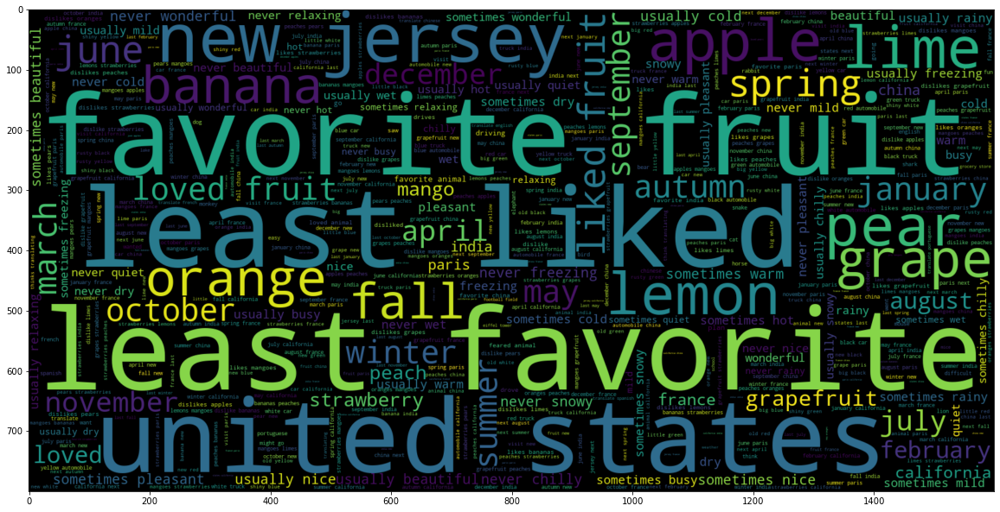

In [67]:
# plot the word cloud for text that is Real
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000, width = 1600, height = 800 ).generate(" ".join(df.english))
plt.imshow(wc, interpolation = 'bilinear')

In [23]:
df.english[0]
nltk.word_tokenize(df.english[0])

['new',
 'jersey',
 'is',
 'sometimes',
 'quiet',
 'during',
 'autumn',
 'and',
 'it',
 'is',
 'snowy',
 'in',
 'april']

In [68]:
# Maximum length (number of words) per document. We will need it later for embeddings
maxlen_english = -1
for doc in df.english:
    tokens = nltk.word_tokenize(doc)
    if(maxlen_english < len(tokens)):
        maxlen_english = len(tokens)
print("The maximum number of words in any document = ", maxlen_english)

The maximum number of words in any document =  15


MINI CHALLENGE #4 (QUIZ!): 
- Perform similar data visualizations but for the french language instead
- What are the top 3 common french words?!
- What is the maximum number of words in any french document?

In [70]:
frenchword = []
for i in df.french:
    for word in i.split():
        frenchword.append(word)
frenchword

['new',
 'jersey',
 'est',
 'parfois',
 'calme',
 'pendant',
 "l'",
 'automne',
 'et',
 'il',
 'est',
 'neigeux',
 'en',
 'avril',
 'les',
 'états-unis',
 'est',
 'généralement',
 'froid',
 'en',
 'juillet',
 'et',
 'il',
 'gèle',
 'habituellement',
 'en',
 'novembre',
 'california',
 'est',
 'généralement',
 'calme',
 'en',
 'mars',
 'et',
 'il',
 'est',
 'généralement',
 'chaud',
 'en',
 'juin',
 'les',
 'états-unis',
 'est',
 'parfois',
 'légère',
 'en',
 'juin',
 'et',
 'il',
 'fait',
 'froid',
 'en',
 'septembre',
 'votre',
 'moins',
 'aimé',
 'fruit',
 'est',
 'le',
 'raisin',
 'mais',
 'mon',
 'moins',
 'aimé',
 'est',
 'la',
 'pomme',
 'son',
 'fruit',
 'préféré',
 'est',
 "l'orange",
 'mais',
 'mon',
 'préféré',
 'est',
 'le',
 'raisin',
 'paris',
 'est',
 'relaxant',
 'en',
 'décembre',
 'mais',
 'il',
 'est',
 'généralement',
 'froid',
 'en',
 'juillet',
 'new',
 'jersey',
 'est',
 'occupé',
 'au',
 'printemps',
 'et',
 'il',
 'est',
 'jamais',
 'chaude',
 'en',
 'mars',
 'n

In [71]:
french_words_counts = Counter(frenchword)
french_words_counts

Counter({'new': 11047,
         'jersey': 11052,
         'est': 196809,
         'parfois': 37746,
         'calme': 7256,
         'pendant': 10741,
         "l'": 32917,
         'automne': 14727,
         'et': 59851,
         'il': 84079,
         'neigeux': 1867,
         'en': 105768,
         'avril': 8954,
         'les': 65255,
         'états-unis': 11210,
         'généralement': 31292,
         'froid': 16794,
         'juillet': 8956,
         'gèle': 3622,
         'habituellement': 6215,
         'novembre': 8951,
         'california': 3061,
         'mars': 9023,
         'chaud': 16405,
         'juin': 9133,
         'légère': 63,
         'fait': 2916,
         'septembre': 8958,
         'votre': 9368,
         'moins': 27557,
         'aimé': 25852,
         'fruit': 23626,
         'le': 35306,
         'raisin': 4852,
         'mais': 63987,
         'mon': 9403,
         'la': 49861,
         'pomme': 4848,
         'son': 16496,
         'préféré': 23305,
   

In [74]:
french_words_counts = sorted(french_words_counts.items(), key = operator.itemgetter(1),reverse=True)
french_words_counts

[('est', 196809),
 ('en', 105768),
 ('il', 84079),
 ('les', 65255),
 ('mais', 63987),
 ('et', 59851),
 ('la', 49861),
 ('parfois', 37746),
 ('jamais', 37215),
 ('le', 35306),
 ("l'", 32917),
 ('généralement', 31292),
 ('moins', 27557),
 ('aimé', 25852),
 ('au', 25738),
 ('fruit', 23626),
 ('préféré', 23305),
 ('agréable', 17751),
 ('froid', 16794),
 ('son', 16496),
 ('chaud', 16405),
 ('de', 15070),
 ('plus', 14934),
 ('automne', 14727),
 ('mois', 14350),
 ('à', 13870),
 ('elle', 12056),
 ('citrons', 11679),
 ('paris', 11334),
 ('inde', 11277),
 ('états-unis', 11210),
 ('france', 11170),
 ('jersey', 11052),
 ('new', 11047),
 ('chine', 10936),
 ('pendant', 10741),
 ('pamplemousse', 10140),
 ('mon', 9403),
 ('votre', 9368),
 ('juin', 9133),
 ('printemps', 9100),
 ('janvier', 9090),
 ('hiver', 9038),
 ('mars', 9023),
 ('été', 8999),
 ('mai', 8995),
 ('septembre', 8958),
 ('juillet', 8956),
 ('avril', 8954),
 ('novembre', 8951),
 ('décembre', 8945),
 ('février', 8942),
 ('octobre', 8911),


In [75]:
# append the values to a list for visualization purposes
french_words = []
french_counts = []
for i in range(len(french_words_counts)):
  french_words.append(french_words_counts[i][0])
  french_counts.append(french_words_counts[i][1])

In [76]:
french_words

['est',
 'en',
 'il',
 'les',
 'mais',
 'et',
 'la',
 'parfois',
 'jamais',
 'le',
 "l'",
 'généralement',
 'moins',
 'aimé',
 'au',
 'fruit',
 'préféré',
 'agréable',
 'froid',
 'son',
 'chaud',
 'de',
 'plus',
 'automne',
 'mois',
 'à',
 'elle',
 'citrons',
 'paris',
 'inde',
 'états-unis',
 'france',
 'jersey',
 'new',
 'chine',
 'pendant',
 'pamplemousse',
 'mon',
 'votre',
 'juin',
 'printemps',
 'janvier',
 'hiver',
 'mars',
 'été',
 'mai',
 'septembre',
 'juillet',
 'avril',
 'novembre',
 'décembre',
 'février',
 'octobre',
 'aime',
 'août',
 'merveilleux',
 'relaxant',
 'doux',
 'humide',
 'notre',
 'californie',
 'sec',
 'leur',
 'occupé',
 'pluvieux',
 'calme',
 'beau',
 'habituellement',
 'pommes',
 'pêches',
 'oranges',
 'poires',
 'fraises',
 'bananes',
 'verts',
 'raisins',
 'mangues',
 "d'",
 'mangue',
 'gel',
 'raisin',
 'pomme',
 "l'orange",
 'citron',
 'chaux',
 'banane',
 'poire',
 'fraise',
 'pêche',
 'pas',
 'enneigée',
 'favori',
 'déteste',
 'gèle',
 'fruits',
 '

In [77]:
french_counts

[196809,
 105768,
 84079,
 65255,
 63987,
 59851,
 49861,
 37746,
 37215,
 35306,
 32917,
 31292,
 27557,
 25852,
 25738,
 23626,
 23305,
 17751,
 16794,
 16496,
 16405,
 15070,
 14934,
 14727,
 14350,
 13870,
 12056,
 11679,
 11334,
 11277,
 11210,
 11170,
 11052,
 11047,
 10936,
 10741,
 10140,
 9403,
 9368,
 9133,
 9100,
 9090,
 9038,
 9023,
 8999,
 8995,
 8958,
 8956,
 8954,
 8951,
 8945,
 8942,
 8911,
 8870,
 8789,
 8704,
 8458,
 8458,
 8446,
 8319,
 8189,
 7957,
 7855,
 7782,
 7658,
 7256,
 6387,
 6215,
 5844,
 5844,
 5844,
 5844,
 5844,
 5844,
 5835,
 5780,
 5774,
 5100,
 4899,
 4886,
 4852,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4848,
 4495,
 4008,
 3857,
 3743,
 3622,
 3566,
 3510,
 3411,
 3185,
 3131,
 3061,
 3016,
 2916,
 2726,
 2715,
 2520,
 2517,
 2435,
 2248,
 1944,
 1927,
 1867,
 1706,
 1666,
 1548,
 1465,
 1437,
 1356,
 1308,
 1278,
 1239,
 1198,
 1180,
 1124,
 1116,
 1111,
 1111,
 1094,
 1072,
 1053,
 1018,
 1001,
 972,
 972,
 966,
 908,
 837,
 836,
 834,
 7

In [78]:
fig = px.bar(x= french_words,y = french_counts)
fig.show()

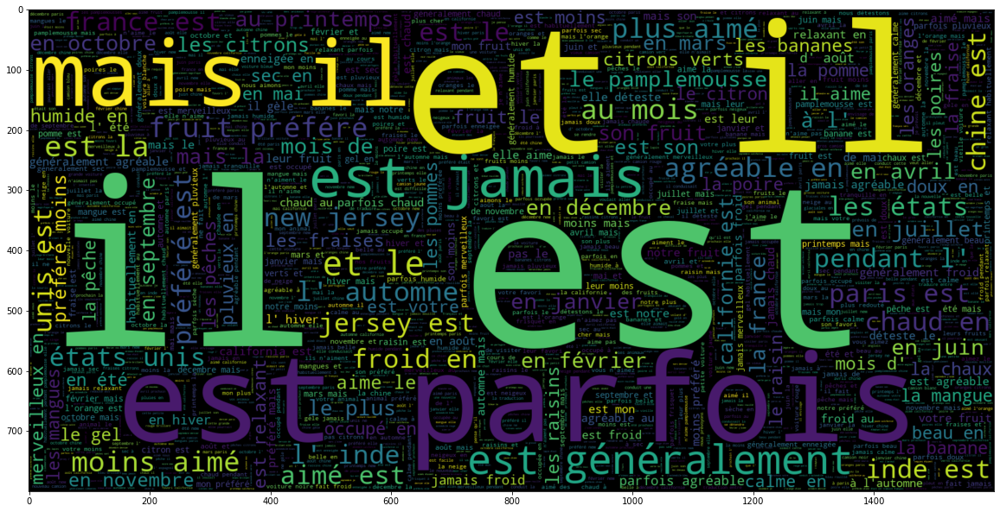

In [82]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud(max_words=2000,width=1600,height=800).generate(' '.join(df.french)), interpolation='bilinear')

In [83]:
# Maximum length (number of words) per document. We will need it later for embeddings
maxlen_french = -1
for doc in df.french:
    tokens = nltk.word_tokenize(doc)
    if(maxlen_french < len(tokens)):
        maxlen_french = len(tokens)
print("The maximum number of words in any document = ", maxlen_french)

The maximum number of words in any document =  23


# TASK #5: PREPARE THE DATA BY PERFORMING TOKENIZATION AND PADDING

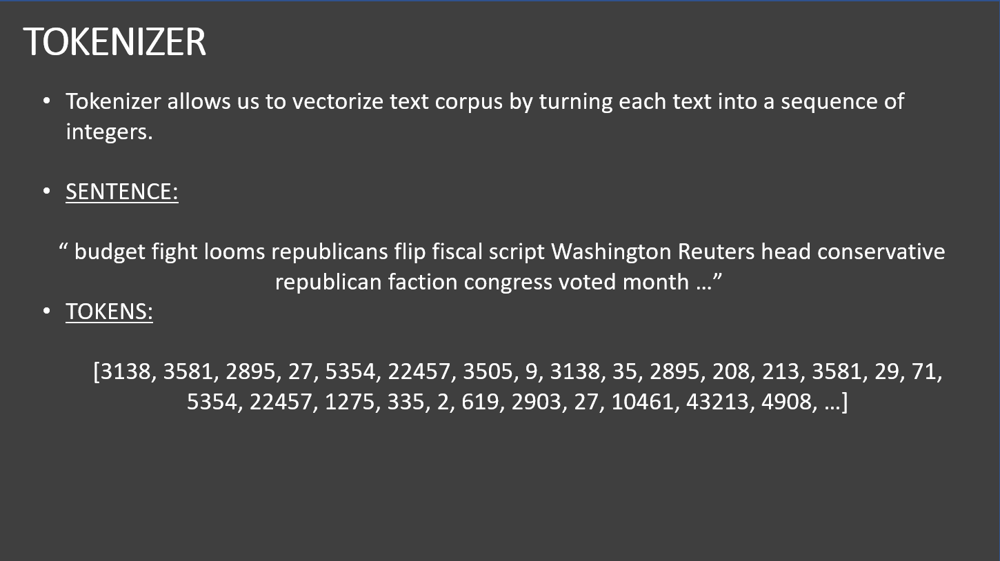

In [84]:
def tokenize_and_pad(x, maxlen):
  #  a tokenier to tokenize the words and create sequences of tokenized words
  tokenizer = Tokenizer(char_level = False)
  tokenizer.fit_on_texts(x)
  sequences = tokenizer.texts_to_sequences(x)
  padded = pad_sequences(sequences, maxlen = maxlen, padding = 'post')
  return tokenizer, sequences, padded

In [85]:
# tokenize and padding to the data 
x_tokenizer, x_sequences, x_padded = tokenize_and_pad(df.english, maxlen_english)
y_tokenizer, y_sequences, y_padded = tokenize_and_pad(df.french,  maxlen_french)

In [87]:
# Total vocab size, since we added padding we add 1 to the total word count
total_english_words = len(english_words)
english_vocab_size = total_english_words + 1
print("Complete English Vocab Size:", english_vocab_size)

Complete English Vocab Size: 200


In [88]:
# Total vocab size, since we added padding we add 1 to the total word count
total_french_words = len(french_words)
french_vocab_size = total_french_words + 1
print("Complete French Vocab Size:", french_vocab_size)

Complete French Vocab Size: 351


In [89]:
print("The tokenized version for document\n", df.english[-1:].item(),"\n is : ", x_padded[-1:])

The tokenized version for document
 the orange is her favorite fruit  but the banana is your favorite  
 is :  [[ 5 84  1 32 11 13  6  5 87  1 29 11  0  0  0]]


In [90]:
print("The tokenized version for document\n", df.french[-1:].item(),"\n is : ", y_padded[-1:])

The tokenized version for document
 l'orange est son fruit préféré  mais la banane est votre favori  
 is :  [[84  1 20 16 17  5  7 87  1 40 93  0  0  0  0  0  0  0  0  0  0  0  0]]


In [91]:
# function to obtain the text from padded variables
def pad_to_text(padded, tokenizer):

    id_to_word = {id: word for word, id in tokenizer.word_index.items()}
    id_to_word[0] = ''

    return ' '.join([id_to_word[j] for j in padded])

In [94]:
pad_to_text(y_padded[0], y_tokenizer).strip()

"new jersey est parfois calme pendant l' automne et il est neigeux en avril"

In [95]:
pad_to_text(x_padded[0],x_tokenizer).strip()

'new jersey is sometimes quiet during autumn and it is snowy in april'

In [96]:
# Train test split
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_padded, y_padded, test_size = 0.1)

# TASK #6: UNDERSTAND THE THEORY AND INTUITION BEHIND RECURRENT NEURAL NETWORKS AND LSTM


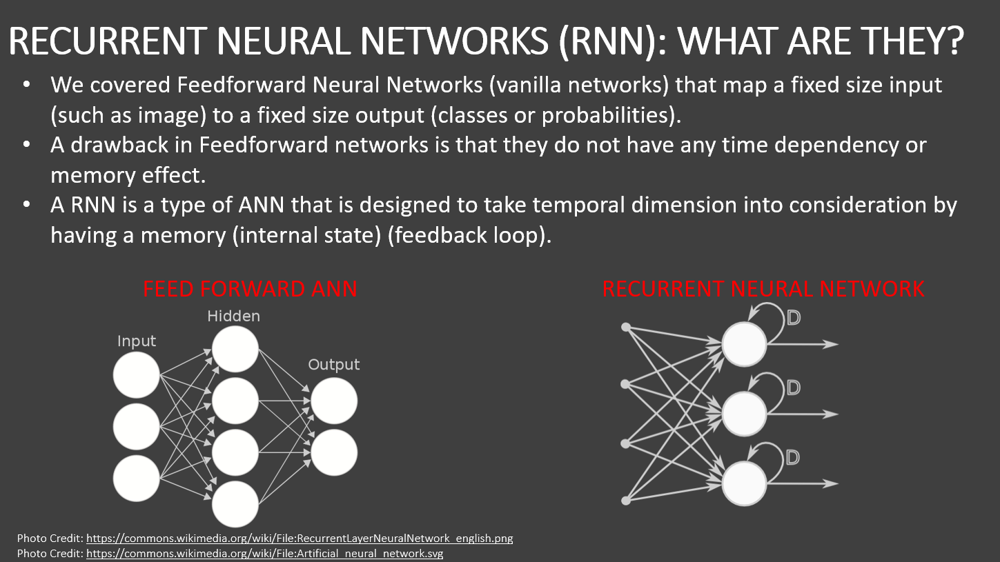

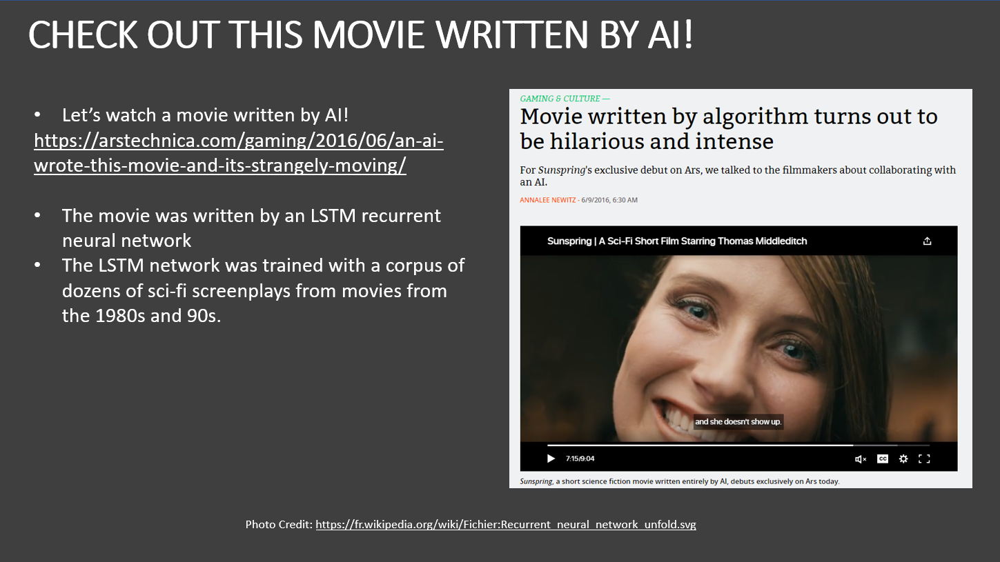

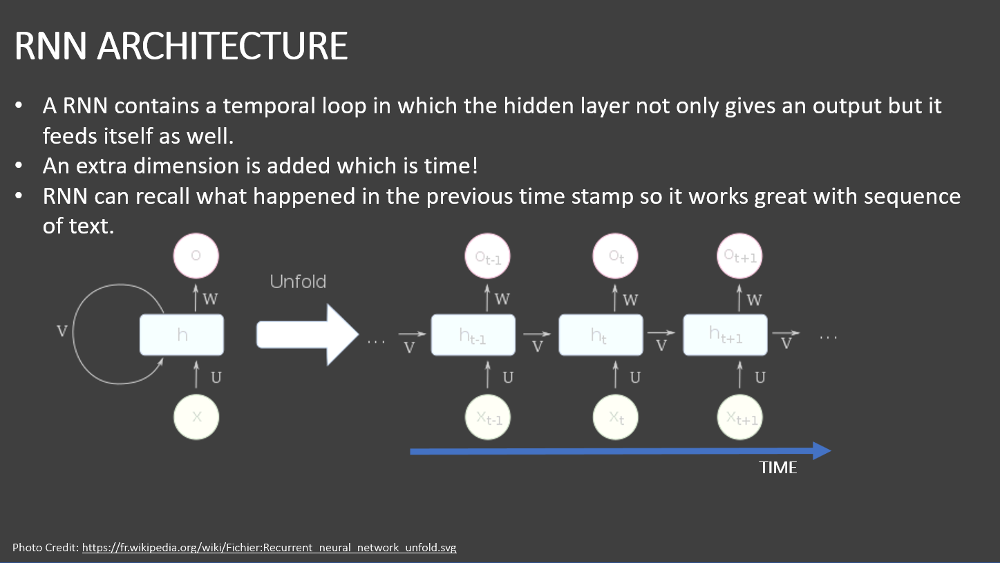

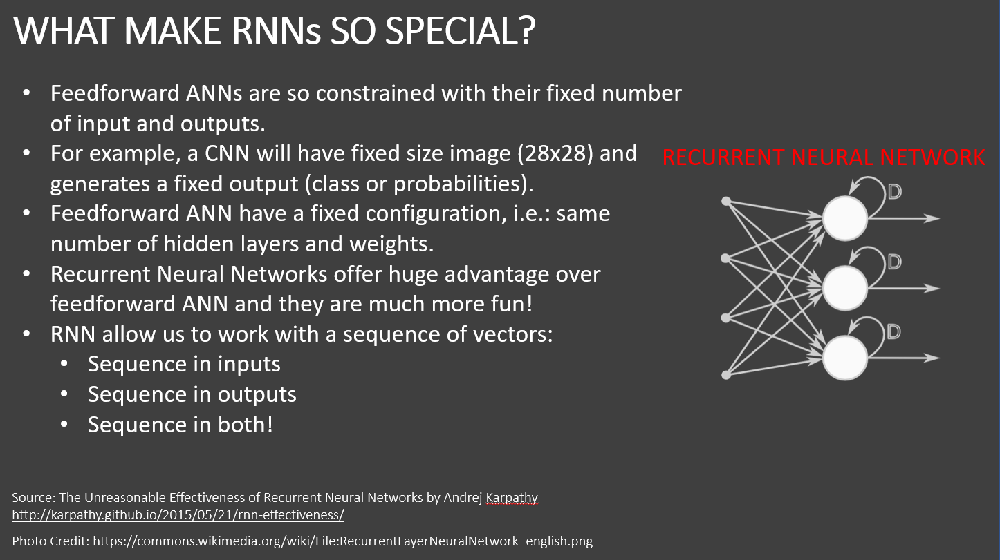

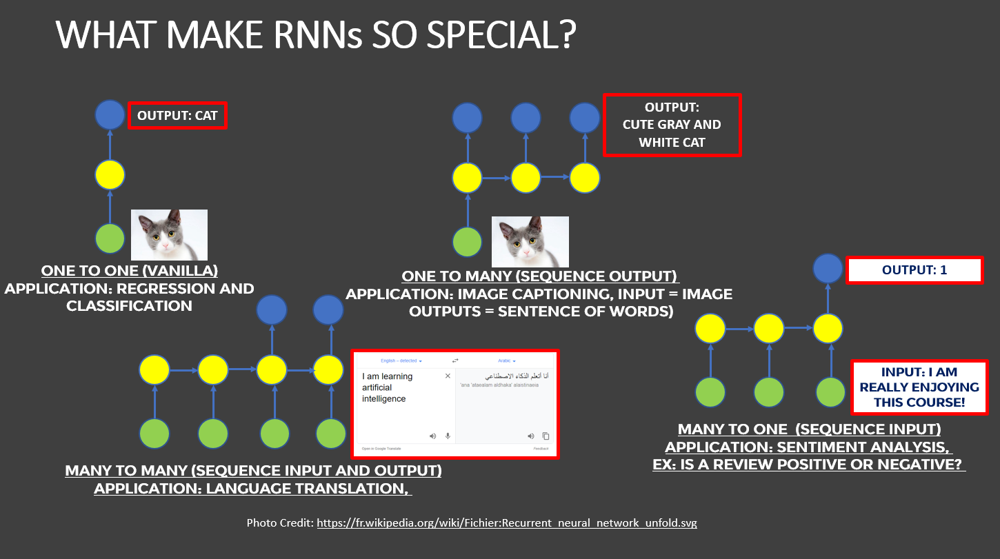

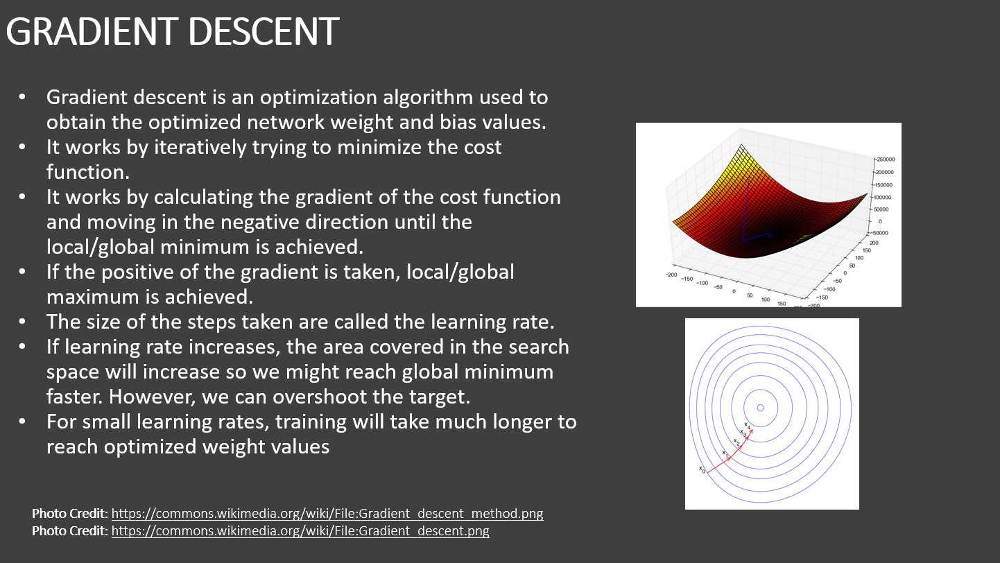

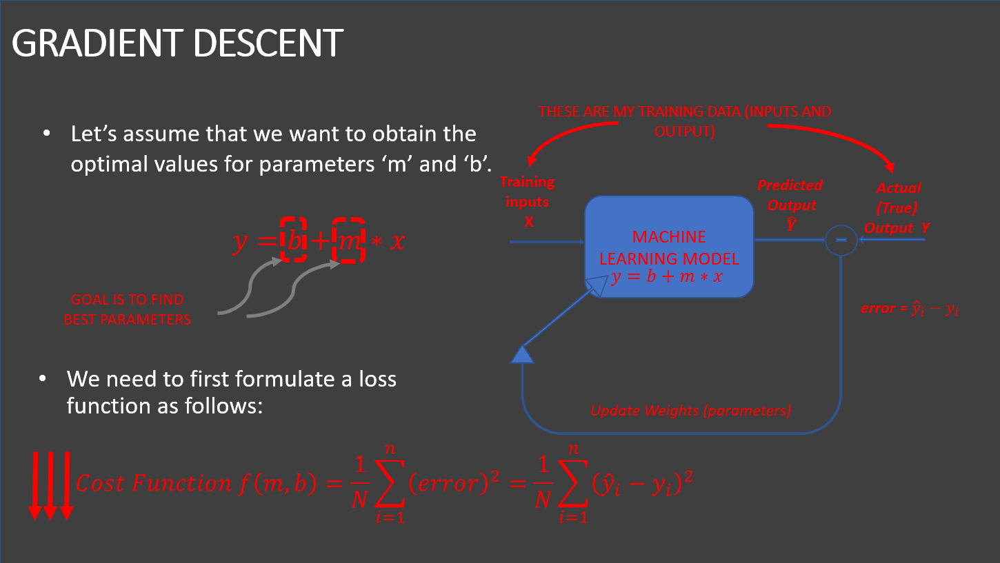

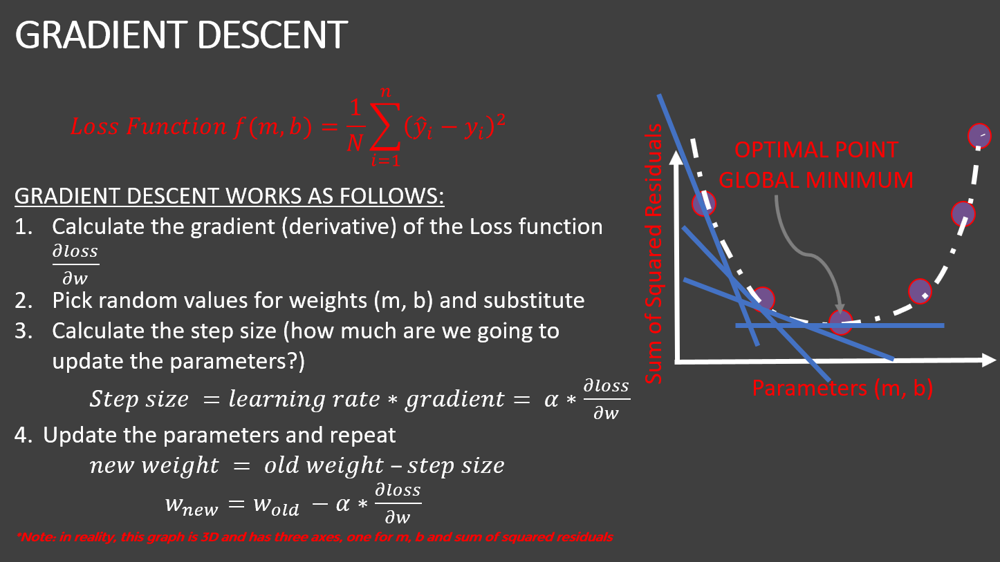

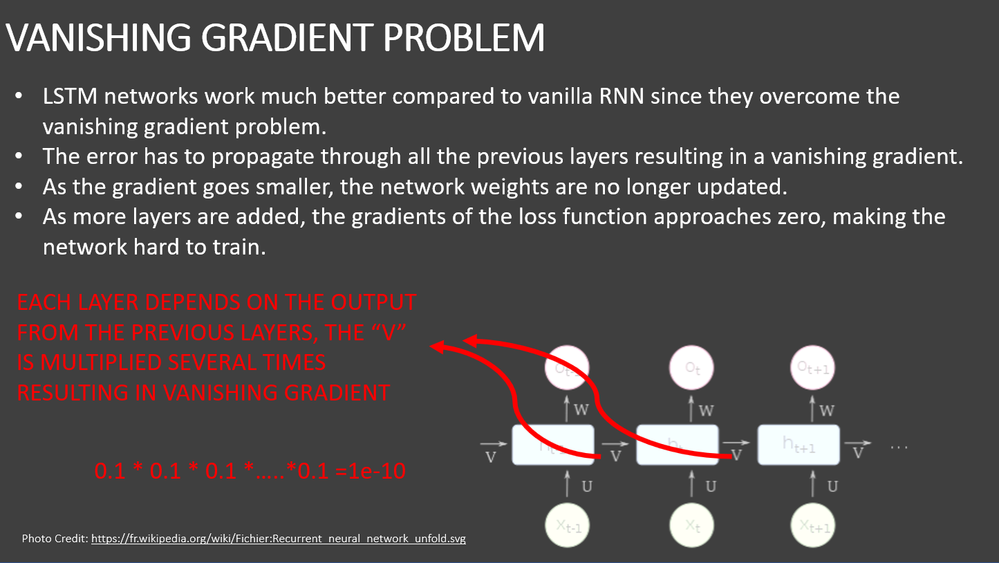

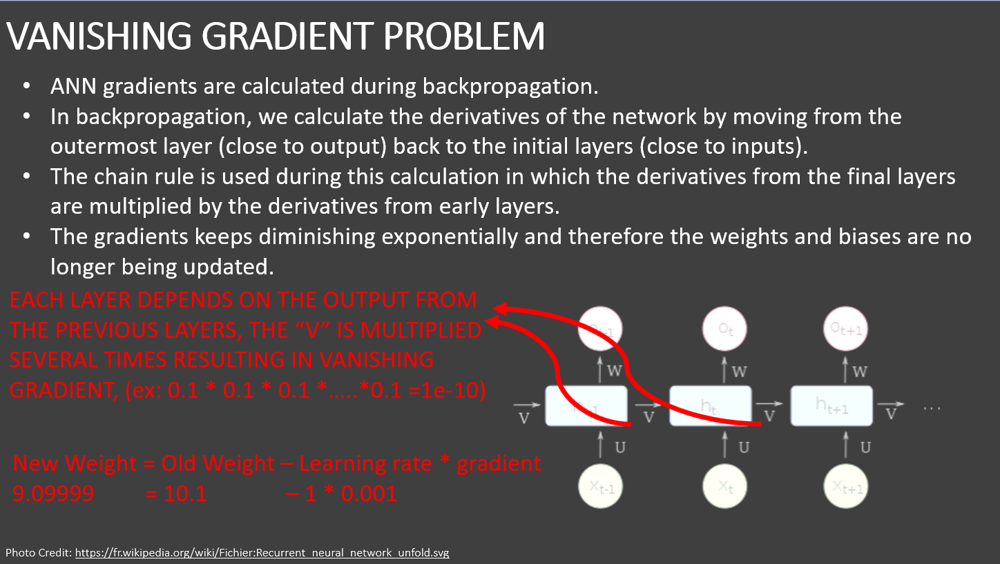

# TASK #7: UNDERSTAND THE INTUITION BEHIND LONG SHORT TERM MEMORY (LSTM) NETWORKS

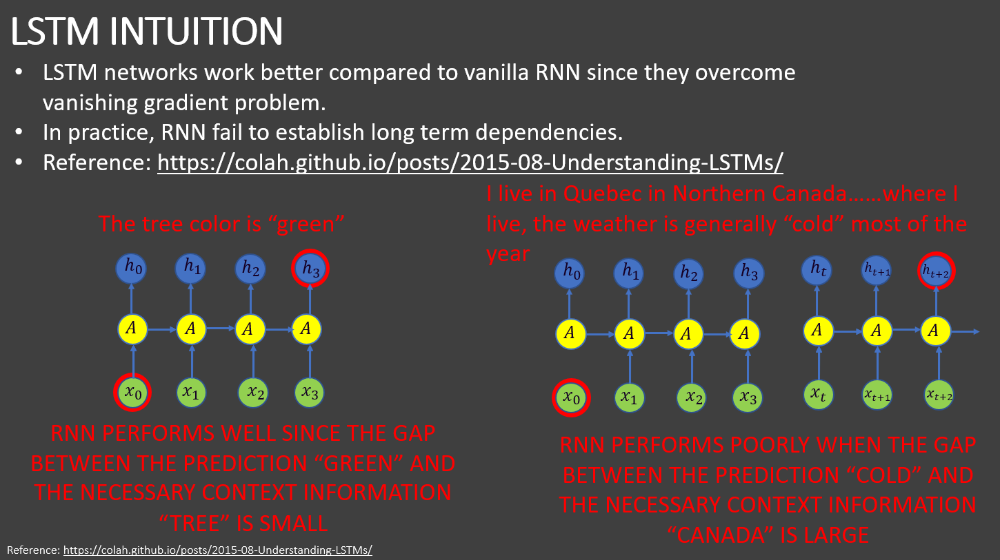

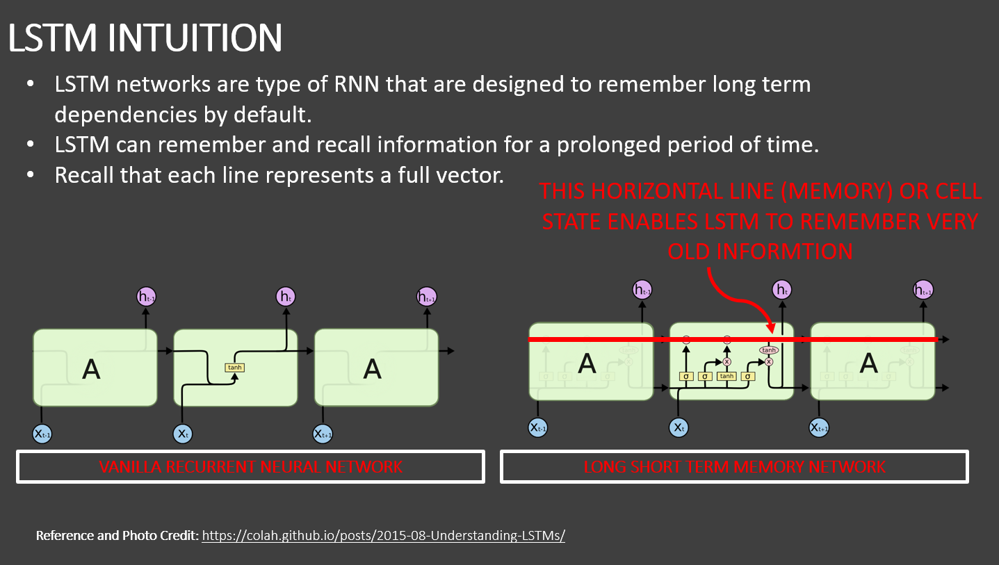

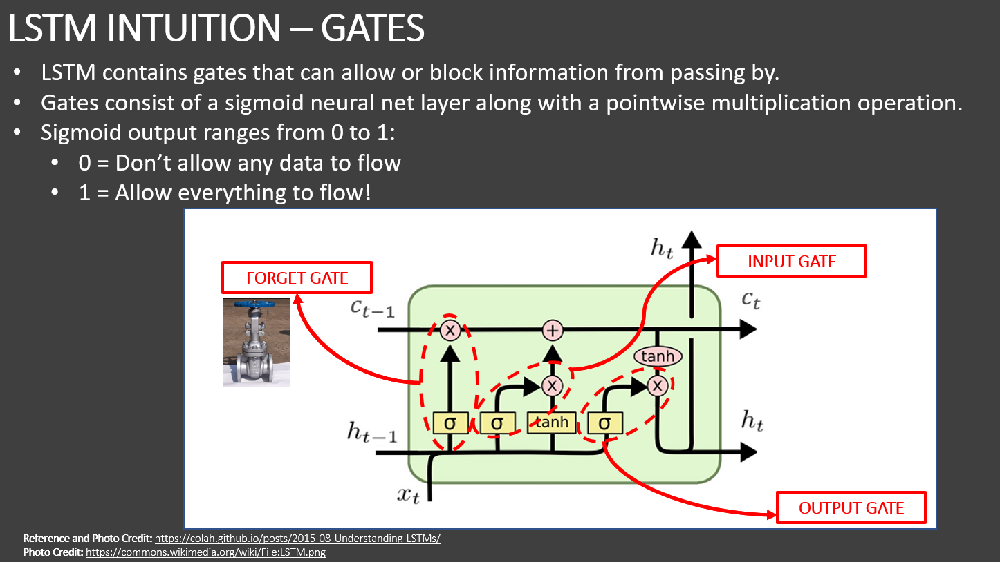

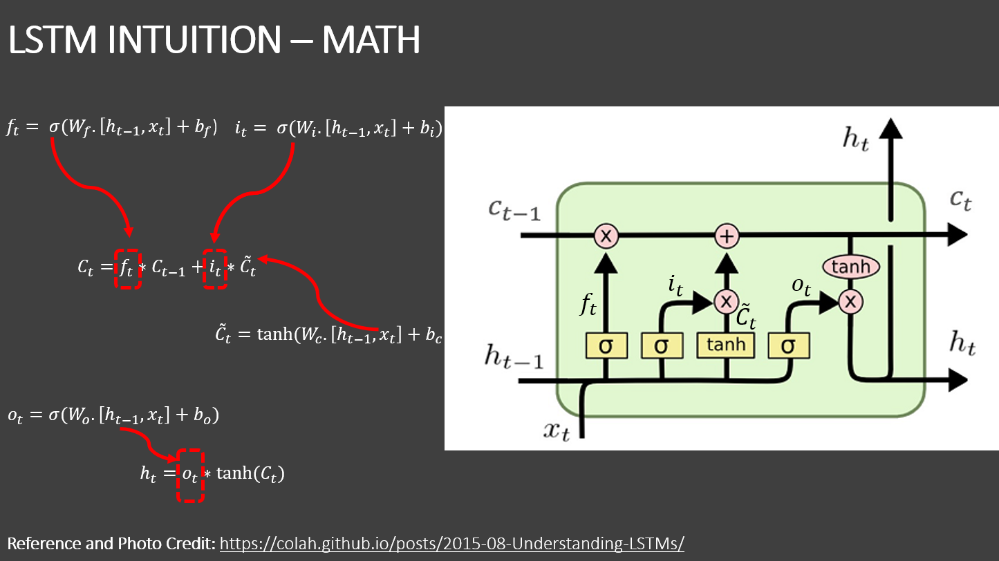

# TASK #8: BUILD AND TRAIN THE MODEL 

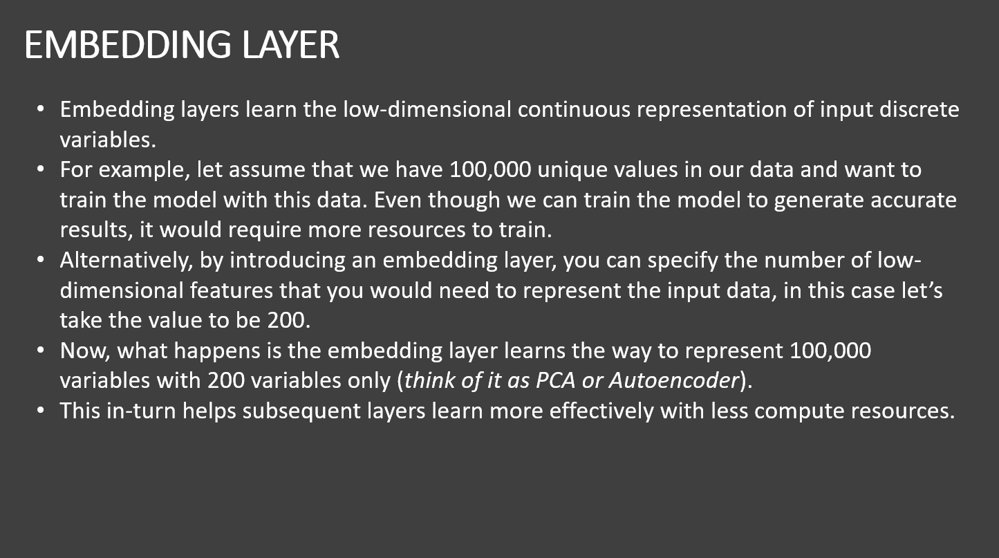

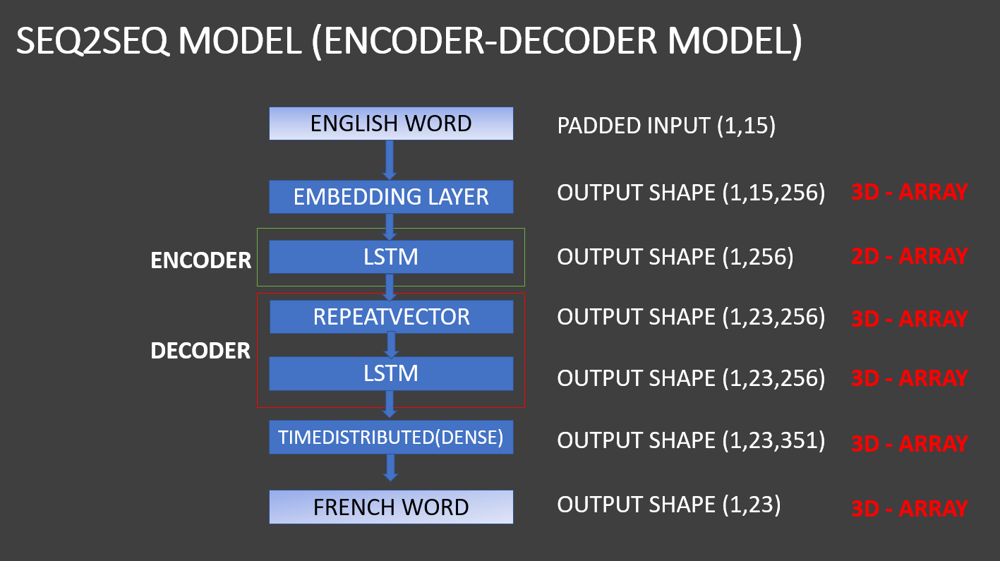

## Model -1

In [97]:
# Sequential Model
model = Sequential()
# embedding layer
model.add(Embedding(english_vocab_size, 256, input_length = maxlen_english, mask_zero = True))
# encoder
model.add(LSTM(256))
# decoder
# repeatvector repeats the input for the desired number of times to change
# 2D-array to 3D array. For example: (1,256) to (1,23,256)
model.add(RepeatVector(maxlen_french))
model.add(LSTM(256, return_sequences= True ))
model.add(TimeDistributed(Dense(french_vocab_size, activation ='softmax')))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 15, 256)           51200     
                                                                 
 lstm (LSTM)                 (None, 256)               525312    
                                                                 
 repeat_vector (RepeatVector  (None, 23, 256)          0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 23, 256)           525312    
                                                                 
 time_distributed (TimeDistr  (None, 23, 351)          90207     
 ibuted)                                                         
                                                                 
Total params: 1,192,031
Trainable params: 1,192,031
Non-

In [98]:
# change the shape of target from 2D to 3D
y_train = np.expand_dims(y_train, axis = 2)
y_train.shape

(124074, 23, 1)

In [99]:
# train the model
model.fit(x_train, y_train, batch_size=1024, validation_split= 0.1, epochs=10)

Epoch 1/10
110/110 [==============================] - 164s 1s/step - loss: 2.7088 - accuracy: 0.4947 - val_loss: 2.1151 - val_accuracy: 0.5464
Epoch 2/10
110/110 [==============================] - 158s 1s/step - loss: 1.8603 - accuracy: 0.5720 - val_loss: 1.5888 - val_accuracy: 0.6022
Epoch 3/10
110/110 [==============================] - 157s 1s/step - loss: 1.4806 - accuracy: 0.6207 - val_loss: 1.3593 - val_accuracy: 0.6444
Epoch 4/10
110/110 [==============================] - 158s 1s/step - loss: 1.2788 - accuracy: 0.6551 - val_loss: 1.1806 - val_accuracy: 0.6710
Epoch 5/10
110/110 [==============================] - 160s 1s/step - loss: 1.0972 - accuracy: 0.6924 - val_loss: 1.0282 - val_accuracy: 0.7070
Epoch 6/10
110/110 [==============================] - 157s 1s/step - loss: 0.9566 - accuracy: 0.7282 - val_loss: 0.8929 - val_accuracy: 0.7411
Epoch 7/10
110/110 [==============================] - 157s 1s/step - loss: 0.8469 - accuracy: 0.7567 - val_loss: 0.8054 - val_accuracy: 0.7665

In [100]:
# save the model
model.save("weights.h5")

MINI CHALLENGE #6:
- Train the model with different embedding output dimension and comment on model performance during training


## Model -2

In [108]:
# Sequential Model
model_1 = Sequential()
# embedding layer
model_1.add(Embedding(english_vocab_size, 400, input_length = maxlen_english, mask_zero = True))
# encoder
model_1.add(LSTM(400))
# decoder
# repeatvector repeats the input for the desired number of times to change
# 2D-array to 3D array. For example: (1,400) to (1,23,400)
model_1.add(RepeatVector(maxlen_french))
model_1.add(LSTM(400, return_sequences= True ))
model_1.add(TimeDistributed(Dense(french_vocab_size, activation ='softmax')))
model_1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 15, 400)           80000     
                                                                 
 lstm_4 (LSTM)               (None, 400)               1281600   
                                                                 
 repeat_vector_2 (RepeatVect  (None, 23, 400)          0         
 or)                                                             
                                                                 
 lstm_5 (LSTM)               (None, 23, 400)           1281600   
                                                                 
 time_distributed_2 (TimeDis  (None, 23, 351)          140751    
 tributed)                                                       
                                                                 
Total params: 2,783,951
Trainable params: 2,783,951
No

In [109]:
model_1.fit(x_train, y_train, batch_size=1024, validation_split= 0.1, epochs=20)

Epoch 1/20
110/110 [==============================] - 279s 3s/step - loss: 2.6377 - accuracy: 0.4982 - val_loss: 1.9917 - val_accuracy: 0.5525
Epoch 2/20
110/110 [==============================] - 277s 3s/step - loss: 1.6555 - accuracy: 0.5941 - val_loss: 1.4553 - val_accuracy: 0.6221
Epoch 3/20
110/110 [==============================] - 273s 2s/step - loss: 1.3302 - accuracy: 0.6466 - val_loss: 1.2044 - val_accuracy: 0.6669
Epoch 4/20
110/110 [==============================] - 274s 2s/step - loss: 1.0867 - accuracy: 0.6965 - val_loss: 0.9606 - val_accuracy: 0.7290
Epoch 5/20
110/110 [==============================] - 276s 3s/step - loss: 0.8863 - accuracy: 0.7455 - val_loss: 0.8931 - val_accuracy: 0.7386
Epoch 6/20
110/110 [==============================] - 273s 2s/step - loss: 0.7553 - accuracy: 0.7792 - val_loss: 0.6903 - val_accuracy: 0.7975
Epoch 7/20
110/110 [==============================] - 275s 2s/step - loss: 0.6290 - accuracy: 0.8175 - val_loss: 0.6576 - val_accuracy: 0.8054

In [112]:
model_1.save("weights_1.h5")

# TASK #9: ASSESS TRAINED MODEL PERFORMANCE


In [124]:
y_test.shape

(13786, 23)

In [105]:
x_test.shape

(13786, 15)

In [169]:
# function to make prediction
def prediction(x, x_tokenizer = x_tokenizer, y_tokenizer = y_tokenizer):
    predictions = model_1.predict(x)[0]
    id_to_word = {id: word for word, id in y_tokenizer.word_index.items()}
    id_to_word[0] = ''
    return ' '.join([id_to_word[j] for j in np.argmax(predictions,1)])

## Actual English - Actual French - Predicted French Comparison

In [186]:
for i in range(20):

  print('Original English Sentence - {}\n'.format(pad_to_text(x_test[i], x_tokenizer)))
  print('Original French Sentence - {}\n'.format(pad_to_text(y_test[i], y_tokenizer)))
  print('Predicted French Sentence - {}\n\n\n\n'.format(prediction(x_test[i:i+1])))

Original English Sentence - her favorite fruit is the lemon but their favorite is the apple   

Original French Sentence - son fruit préféré est le citron mais leur préféré est la pomme           

1/1 [==============================] - 0s 21ms/step
Predicted French Sentence - son fruit préféré est le citron mais leur préféré est la pomme           




Original English Sentence - france is sometimes quiet during august and it is never dry in october  

Original French Sentence - la france est parfois calme au mois d' août et il est jamais à sec en octobre      

1/1 [==============================] - 0s 20ms/step
Predicted French Sentence - la france est parfois calme au mois d' août et il est jamais sec sec en octobre      




Original English Sentence - he drives that little yellow car         

Original French Sentence - il conduit cette petite voiture jaune                 

1/1 [==============================] - 0s 19ms/step
Predicted French Sentence - il conduit cette petite vo

In [171]:
y_prediction_list = [ prediction(x_test[i:i+1]) for i in range(0,len(y_predict_test))]

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


In [173]:
y_test_list = [ pad_to_text(y_test[i], y_tokenizer).strip() for i in range(0,len(y_predict_test))]

In [191]:
x_test_list = [ pad_to_text(x_test[i], x_tokenizer).strip() for i in range(0,len(y_predict_test))]

In [174]:
y_prediction_list = [ y_prediction_list[i].strip() for i in range(0,len(y_predict_test))]

In [192]:
Result_test = pd.DataFrame({'English Actual':x_test_list,'French Prediction':y_prediction_list,'French Actual':y_test_list})

In [194]:
List=[]
for i in range(0,len(y_predict_test)):
    if Result_test['French Prediction'].iloc[i] == Result_test['French Actual'].iloc[i]:
        List.append(1)
    else:
        List.append(0)
Result_test['isequal'] = List

In [195]:
Result_test

,English Actual,French Prediction,French Actual,isequal
0,her favorite fruit is the lemon but their favo...,son fruit préféré est le citron mais leur préf...,son fruit préféré est le citron mais leur préf...,1
1,france is sometimes quiet during august and it...,la france est parfois calme au mois d' août et...,la france est parfois calme au mois d' août et...,0
2,he drives that little yellow car,il conduit cette petite voiture jaune,il conduit cette petite voiture jaune,1
3,they dislike limes mangoes and grapefruit,ils n'aiment pas citrons verts mangues et le,ils n'aiment pas citrons verts mangues et le p...,0
4,the banana is my least favorite fruit but the ...,la banane est mon fruit préféré moins mais la ...,la banane est mon fruit préféré moins mais la ...,1
...,...,...,...,...
13781,she likes grapefruit limes and pears,elle aime le pamplemousse citrons verts et les...,elle aime le pamplemousse citrons verts et les...,1
13782,india is usually hot during autumn and it is b...,l' inde est généralement chaud pendant l' auto...,l' inde est généralement chaud pendant l' auto...,1
13783,he likes limes mangoes and bananas,il aime citrons verts mangues et les bananes,il aime citrons verts mangues et les bananes,1
13784,california is never quiet during april and it ...,california est jamais tranquille en avril et i...,california est jamais tranquille en avril et i...,1


In [196]:
# accuracy score(%) = (correct/total)*100

accuracy = round((Result_test['isequal'].value_counts()[1]/len(Result_test))*100,2)
print(f'Accuracy : {accuracy} %')

Accuracy : 78.59 %
